<a name="learning-goals"></a>
<h2> Proje Ana Hatları </h2>
<ol>
<li>Bir Auto Encoder kullanımı yapılacaktır.</li>
<li>Auto encoderlar içerisinde gizlenmiş olan değerlerin incelenmesi yapılacaktır. </li>
<li>Bir sınıflayıcı network softmax ve onehot kodlama implement edilecektir. </li>
</0l>



# İçindekiler

<!-- MarkdownTOC autolink=true autoanchor=true bracket=round -->

- [Proje Giriş](#assignment-synopsis)
- [Birinci Bölüm - Autoencoderlar](#part-one---autoencoders)
    - [Genel İşlem adımları](#instructions)
    - [Kodlar](#code)
- [Part iki - Benim veri Setim üzerinde işlemler](#part-two---my-data-set)
    - [Genel bilgi](#instructions-1)

<!-- /MarkdownTOC -->

**_Onehot_** kodlama olarak bilinen kodlama methoduna göre bir sınıflandırma probleminde sınıf değerleri ait sınıf 1 diğerleri 0 dan oluşan bir sparse vektör ile ifade edilmesine denir. 

Şimdi öncelikle yüklenmiş olan kütüphanelerin yeterli olup olmadığına bakılır. Bunun için aşağıdaki kodda kütüphanelerin bulunmadığı durumda hata fırlatılmakta ve sonucunda fırlatılan hata yakalanılarak gerekli kütüphaneler pip ile kurulmaktadır. 

**libs**  klasörü yardımcı method ve sınıfları içermektedir. **Libs** klasörünün ulaşılabilir olmasına dikkat edilmesi gerekir.



In [1]:
# First check the Python version
import sys
if sys.version_info < (3,4):
    print('Python versiyonu 3.4 ve üstü olması gerekmektedir. ')


# Now get necessary libraries
try:
    import os
    import numpy as np
    import matplotlib.pyplot as plt
    from skimage.transform import resize
    from skimage import data
    from scipy.misc import imresize
    import IPython.display as ipyd
except ImportError:
    print('Bazı Paketlerin kurulması gerekmektedir' \
          'Notebooktan kurulum yapılacaktır. ! işareti kullanılarak shell script yazılarabilir.')
    !pip install "numpy>=1.11.0" "matplotlib>=1.5.1" "scikit-image>=0.11.3" "scikit-learn>=0.17" "scipy>=0.17.0"
    import os
    import numpy as np
    import matplotlib.pyplot as plt
    from skimage.transform import resize
    from skimage import data
    from scipy.misc import imresize
    import IPython.display as ipyd
    print('Done!')

# Import Tensorflow
try:
    import tensorflow as tf
except ImportError:
    print("You do not have tensorflow installed!")
    print("Follow the instructions on the following link")
    print("to install tensorflow before continuing:")


try:
    from libs import utils, gif, datasets, dataset_utils, vae, dft
except ImportError:
    print("Projenin doğru çalışabilmesi için libs dosyası ve içindeki script dosyaları "+
          "ile birlikte olması gerekmektedir.")

# We'll tell matplotlib to inline any drawn figures like so:
%matplotlib inline
plt.style.use('ggplot')



<a name="assignment-synopsis"></a>
<h1> Proje Giriş </h1>
<p >Bir yapay sinir ağı birşeyler öğrenmek için özelleşmiş bir veya daha fazla katman ve bunların bir _Cost fonksiyonu_ ile tanımlanır. Böylece gradient descent gibi bir optimizasyon ile networkün optimizasyonu yapılabilir. Yapay sinir ağlarının temsil yeteneğini artıran(representative) bir özellik ise liner işlemlerden sonra linear olmayan işlemlerin uygulanmasıdır. Böylece liner olan işlem bir operasyon alt kümesi oluştururken linear olmayan işlemler ile bu operasyon kümesi içersinde bir şeçilim gerçekleşir. Buda aslında tamda beynimizde olduğu gibi farklı neuronların farklı eşik değerlerinde ateşlenmelerini sağlar. Linear olmayan fonksiyona bu sebepten activasyon fonksiyonu denir.
Buradan şu anlaşılır aslında optimize edilen değer aslında bias değeridir. Biasın bir neuronda olması tamda bu sebepten mantıklı olmaktadır. Farklı neuronların farklı değerler üzerinden özelleşmelerini ve farklı değerler ile aktive olması sağlanarak her neuronun öğrendiklerinin unik olması sağlanmıştır. <p>


<p> İlk Bölümde generative bir model olan auto encoder network eğiticez. Bunu çeşitli resim datasetleri üzerinde yaparak farklı sonuçlar elde edicez. Burada resimlerin okunması için kullanılan yöntemler standartlaşmış _pipline_ yöntemleri kullanılmış ve böylece veritabanı büyük olduğu durumlarada bile çalışan bir mekanizma oluşturulmuştur. 
Elde edilen autoencoder kullanılırken çeşitli yöntemler uygulanabilir. İlk olarak "fully conencted network" yapısı kullanılarak sistem eğitilecektir. Sonrasında aynı autoencoder araya convolusyon layeri eklenerek implement edilecek sonrasında görültü ekleme, layerların birlikte kullanılması gibi farklı obsiyonları kullanılacaktır. 
</p>

</p> Sonraki kısımda oluşturulan autoencodera kendi veri setim ile eğitip kendi oluşturduğum veri seti üzerinde sonuçlar değerlendirilecektir. 
Son bulumda ise bir ara network ile elde edilen özelliklerden bir sınıflandırıcı elde edip bu sınıflandırıcının görüntü dışında nasıl çalıştığını örnekleyeceğiz. Örneğin ses üzerinde nasıl sonuçlar verdiği incelenecektir. Böylece music veya konuşma sınıflandırıcı bir sistem oluşturulacaktır.  
<p>

<p>
Network generic olduğu için bu sistemler arasındaki fark eğitim için verilen verisetlerinin farklı olması olacaktır. Geriye kalan bütün yöntemler aynı olsa da sistemlerin farklı veri setleri üzerinde iyi sonuçlar verdiği görülecektir. 
İlk kısımda yaptığımız çalışma bir unsupervised işlem oalcak ikinci kısımda ise sınıflandırma olduğu için supervised bir çalışma yapılacaktır. Böylece geniş bir spectrumda autoencoder'larla yapılabilınabilinen şeyler örneklendirilecektir.
</p>



<a name="part-one---autoencoders"></a>
# Autoencoderlar

<a name="instructions"></a>
<h2>Genel İşlem adımları</h2>

<p> ilk başta yapılacak şey kullanılacak verisetinin seçilmesi sonrasında ise seçilen veri setindeki görüntülerin belirli bir şekile sokulmasıdır. Daha büyük görüntüler için daha büyük katmana sahip görüntüler lazım olacağı için  görüntüler 200X200 geçmeyecek şekilde seçilecektir. 
Autoencoderlar görüntüye ait özelliklerin sıkıştırılmasında oldukça başarılıdır. Ağ diğer ağlarda da olduğu gibi bir dizi linear işlemden ve onları takip eden lineer olmayan işlemden meydana gelmektedir. 
Burda diğer ağlaradan farklı olarak giriş ve çıkış katmanları birbirleri ile aynı sayıda eleman içermektedir. 

Bu, ağın çıktısının, girişteki gibi olması gerektiğini söyleyerek ağ eğitimini yapmamızı sağlar, böylece o videodaki tüm bilgileri "sıkıştırmaya" çalışır.Autoencoderlar böylece veriyi sıkıştırmadan veriden yeni veri üretmeye kadar geniş bir specktrumda kullanılabilir. 

</p>

<p>İlk etapta kullanılacak verilerin alınması işlemi gerçekleştirilir. </p>

In [2]:
imgs = datasets.CELEB()

_Yardımcı fonksiyon ile Celeb veri seti sisteme yüklenir.Celeb veri seti yüz ile alakalı bir veri seti olup binlerce kişiden alınmış yüz landmarkları içermektedir._
<p>Yüz veri setini ilgili yerden indirerer projenin çalıştığı klasöre kopyalamak gerekmektedir.  </p> 

**CelebFaces Attributes Veri Seti (CelebA), her biri 40 öznitelik notuna sahip, 200.000'den fazla şöhret imajına sahip geniş ölçekli bir yüz özellik veri kümesidir. Bu veri setindeki resimler, büyük poz varyasyonları ve arka plandaki karmaşıklığı kapsar. CelebA, geniş çeşitliliklere, büyük miktarlara ve zengin açıklamalara sahiptir; bunlara şunlar dahildir:**

10.177 kimlik numarası,

202.599 yüz görüntüleri sayısı ve

5 dönüm noktası konumu, görüntü başına 40 ikili öznitelik açıklaması.

Veri seti, yüz özellik tanıma, yüz algılama ve yer işareti (veya yüz kısmı) yerelleştirme gibi  bilgisayar görme görevleri için eğitim ve test setleri olarak kullanılabilir.

In [3]:
print(len(imgs))
#toplam görüntü sayısı 
imgs[1]

202599


'./img_align_celeba/004829.jpg'

(218, 178, 3)


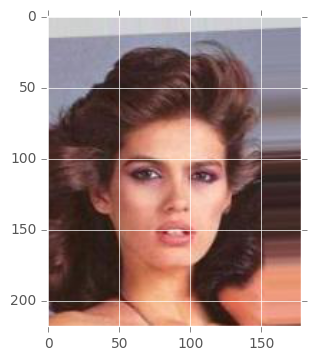

In [4]:
aa = plt.imread(imgs[4])

plt.imshow(aa , cmap='gray')
print(aa.shape)

<p class='red'>Daha sonra, resim listesini bir 4d dizisine dönüştürüyoruz ve bu resimlerden ilk 100 tanesini alarak işlem yapiyoruz. İlerde daha büyük bir ağ ile daha fazla görüntü üzerinde aynı işlem uygulanabilir. 
</p>

In [5]:
from skimage.transform import resize as imresize
dsize=(125, 125)

Xs = []
for i in range(100):
    aa =imresize(plt.imread(imgs[i]), dsize, preserve_range=True) 
    Xs.append(aa)
Xs  = np.array(Xs)

In [6]:
print(Xs.shape)

(100, 125, 125, 3)


Hazır bir fonksiyon kullanarak görüntüleri yığın şekilde parçalara bölme ("batches") ve veriyi eğitim, validasyon ve test şeklinde üçe bölme gerçekleştirilecektir. Fonksiyonun kullanımında veri ve oprisyonel olarak verinin etiketi gönderilir. Bizim burada etiketler üzerinde çalışılmadığı için sadece veriyi gönderme işlemi yapiyoruz. Fonksiyonun yaptığı tek iş veriyi kısımlara bölmektdir.


In [7]:
ds = datasets.Dataset(Xs)

Veri üzerine yazılan bu sınıf çeşitli işlemler içermektedir. Bu işlemleri manuel olarak biz de gerçekliyceğiz. 
örneğin ortamala yüzün bulunması için aşağıdaki gibi bir fonksiyonun çağrılması yeterlidir. Aynı şekilde standart sapma 


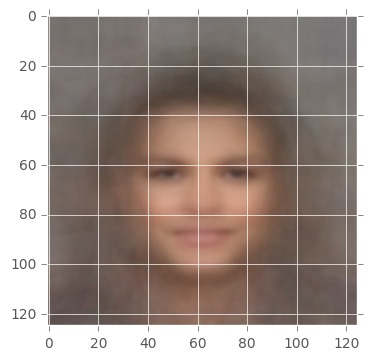

In [8]:
#ortalama görüntü elde etme 

mean_img = ds.mean().astype(np.uint8)
plt.imshow(mean_img)

(125, 125, 3)


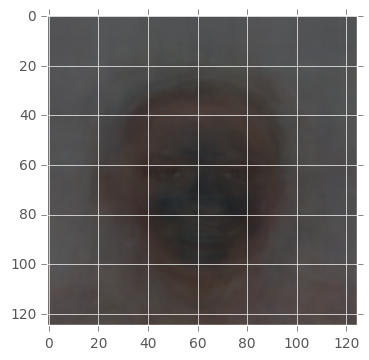

In [9]:
#görüntü üzerindeki standart sapma işlemi 

std_img = ds.std().astype(np.uint8)
plt.imshow(std_img)
print(std_img.shape)

standart sapmada dikkat edilecek şey arka plan çok fazla değişevielceği için standar sapması yüksek yani daha koyu bir görüntü elde edilmiştir. Oysa göz kısımlar ortalama olarak aynı yerlere geldiği için aynıya yakın sonuçlar elde edilmektedir. 
Renk kanalı üzerinden standart sapma alınarak görüntünün tek kanal üzerinden değişikliğinin görülmesi. Böylece head map şeklinde değişiklikler görülebilir.

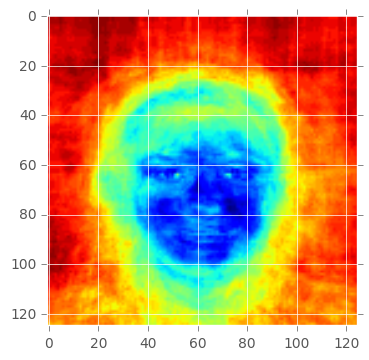

In [10]:

std_img = np.mean(std_img, axis=2).astype(np.uint8)
plt.imshow(std_img)

Şimdi daha fazla değişen noktalar daha net bir şekilde görülmektedir. 


(100, 125, 125, 3)


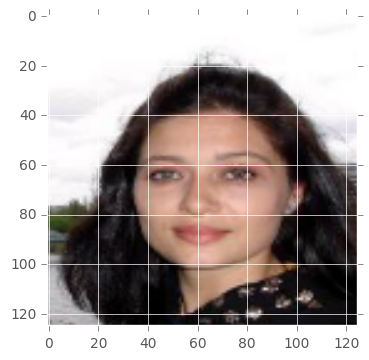

In [11]:
plt.imshow(ds.X[0].astype(np.uint8))
print(ds.X.shape)

Görüntüler gözler ortaya gelecek şekilde yerleştirildikleri için bu şekilde anlamlı bir standart sapma oluşmaktadır. 
kullanılan yardımcı nesne bize verdiği method Python generator yapısını kullandığı için burada generator üzerinden kolaylıkla iterasyon yapılabilmektedir. Örneğin bütün veri setini tek tek dolaşmak istediğimizde aşağıdaki gibi bir kod çalıştırırız. 



In [12]:
for (X, y) in ds.train.next_batch(batch_size=20):
    print(X.shape)

(20, 125, 125, 3)
(20, 125, 125, 3)
(20, 125, 125, 3)
(20, 125, 125, 3)
(20, 125, 125, 3)


X ve Y gibi iki değer dönmesine rağmen biz y değeri vermediğimiz için gelen y değerleri de boş olacaktır. Öte yandan  _"batch-size"_ olarak belirtilen değer her bir iterasyonda istenilen kadar değer dönerken _"next-batch"_ ise bir sonraki kısıma geçmeyi izin verir. 

Autoencoder bütün veri seti üzerinde aynı çalışabilmesi için görüntünün öncelikle preprocess edilmesi gerekmektedir. Bu iş için öncelikle görüntünün normunun alınması gerekmektedir. Normalizasyon işlemi görüntüden ortalama görüntü çıkarılarak standart sapmasına bölünmesi ile elde edilir. 

işlem geri çevrilebilir olması için ise aynı işlemin tersini yapan bir fonksiyon yazılmıştır. 


In [13]:

def preprocess(img, ds):
    norm_img = (img - ds.mean()) / ds.std()
    return norm_img


def deprocess(norm_img, ds):
    img = norm_img * ds.std() + ds.mean()
    return img

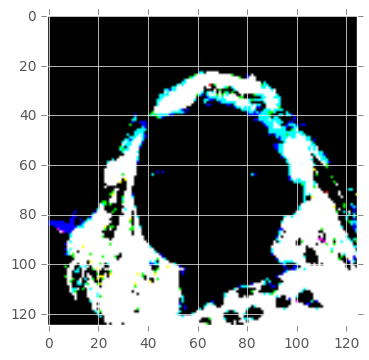

In [14]:
#ilk işlem görmüş görünü şekildeki gibi bir değişikliğe uğramaktadır. 
normiliezed = preprocess(ds.X[0], ds.X)
plt.imshow(normiliezed.astype(np.uint8) )

Şimdi gerekli ön işlem adımlarını anladıktan sonra bir sonraki adım olan Autoencoder işlemine geçebiliriz. İşlem adımları ile herhangi bir görüntünün ortalama değere çekilmesi yapılan işlemlerin yüksek olan değerlerden etkilenerek sapmasının engellemeyi hedeflemektedir. Bu işlem için ilk etapta sadece linear bağlantılar kullanılarak görüntülerin ağırlıkların ard arda sıralanması sağlanmaktadır. Bu sebeple ilk input layerinda kullanılacak değer olarak "batch_size" ve girdi özellik vektörü kadar olması gerekmektedir. Girdi olarak kullandığımız 4 boyutlu matriks olduğu için "batch_size" x Width x Height x Channels olacak şekilde bir girdi değeri ilk katmanda belirlenir. 4 boyutlu girdi datası iki boyutlu olacak şekilde reshape edilip girdi olarak verilebilir. Bu işlem için tensorflow tf.reshape fonksiyonu kullanılarak verilerin sembolik olarak işlenmesi sağlanabilir. 




In [15]:
# Toplam feature sayısını hesaplamak için boyutlar çarpılır. 
#  (height x width x channels).
n_features =  ds.X[0].shape[0]*ds.X[0].shape[1]* ds.X[0].shape[2]
print(ds.X[0].shape[0],ds.X[0].shape[1], ds.X[0].shape[2])
print(n_features)

125 125 3
46875


Toplam özellik sayısını elde ettikten sonra herbir layerda kaç adet artı neurona ihtiyaç duyduğumuzu belirtmemiz gerekmetkedir. Bunun içinde öncelikle layerlarda istediğimiz neuron sayısınca bir liste oluşturmamız gerekmektedir. Böylece autoencoder kullanarak toplamda çok fazla olan özellik saysını iki adet değere düşürmek imkanımız olacaktır. 


In [16]:
encoder_dimensions = [2048, 512, 128, 2]
#layerlarda bulunan neuron sayısı orantılı olarak azaltılarak daha az görüntü sayısı ile bir temsil elde edilir. 

In [17]:
X = tf.placeholder(dtype = tf.float32, shape=(None,n_features) )
print(X.get_shape().as_list() == [None, n_features])
#girdi değerinin beklenen değer olan boyutlar ile aynı olduğu gösterilir. 


True


İlk değeri none olan ve ikinci boyut olarak da toplam özellik sayısında olan bir tensorflow 'placeholder' oluşturularak girdi değerlerinin sistem içerisine girdi olarak verilmesini sağlar. Dışardan girdi olarak değeri olan ve alınan değerleri encode edene aşağıdaki fonksiyon ile devame diyoruz. Her bir katman arasında bir liner çarpma işlemi ve linear olmayan bir işlem yaparak toplamda bir sonraki katmanda boyut indirgeme yapılmaktadır. 



In [18]:
def encode(X, dimensions, activation=tf.nn.tanh):
    # Bütün ağırlıklar tutulması gerektiği için öncelikle bütün ağırlıkları tutan bir değer oluşturmak gerek. 
    Ws = []
    shapes = []
    
    
    # her bir layerın oluşturulması için bir for döngüsü  kullanılacaktır.
    for layer_i, n_output in enumerate(dimensions):

        # değişken isimlerinin uniqliğini saplamak için scope isimlendirmelerinin yapılan işlem ile ilgili 
        # ve yapılan işi tanımlayan uniq isimler olmasını sağlamak gerekmetkedir. 
        #'encoder/layer1', 'encoder/layer2', veya 'encoder/1', 'encoder/2',... 
        
        with tf.variable_scope("encoder/layer{}".format(layer_i)):
        
            n_input = X.get_shape().as_list()[1]

            with tf.variable_scope("fc{}".format(layer_i)):
                W = tf.get_variable(
                    name='W',
                    shape=[n_input, n_output],
                    dtype=tf.float32,
                    initializer=tf.contrib.layers.xavier_initializer())

                b = tf.get_variable(
                    name='b',
                    shape=[n_output],
                    dtype=tf.float32,
                    initializer=tf.constant_initializer(0.0))

                h = tf.nn.bias_add(
                    name='h',
                    value=tf.matmul(X, W),
                    bias=b)

                if activation:
                    h = activation(h)

    
            #Bütün ağırlık değerleri kaydedilerek sonrasında decode işlemi sırasında kullanılmak üzere kaydedilir. 
            Ws.append(W)
            
            # Sonraki işlemde tekrardan kullanılması için network girdileri çıkış değerleri yerine kullanılır. 
            X = h
    
    z = X
    return Ws, z

In [19]:
# oluşturlan Fonsiyon çağrılarak ilk etapta networkün encode kısmı tamalanır.  
Ws, z = encode(X, encoder_dimensions)

# işlemin sonuçlarının doğru olduğu test edilir. 
assert(z.get_shape().as_list() == [None, 2])
assert(len(Ws) == len(encoder_dimensions))

<p>Oluşturlan Fonsiyon çağrılarak ilk etapta networkün encode kısmı tamalanır. Burada dikkat edilmesi gereken konu ise elde edilen ağırlıklara ulaşılabilir olması. Ağırlıklar ulaşılabilir olduğu için tekrardan kullanılması için decode kısmına verilerek elde edilen görüntü ile sonuç görüntüsü arasınaki farka bakılıp sonuçta ağın hatası azaltılmaya çalışılacaktır. Elde edilen ağındaki katmanları listeleyelim.
</p>

In [20]:
[op.name for op in tf.get_default_graph().get_operations()]

['Placeholder',
 'encoder/layer0/fc0/W',
 'encoder/layer0/fc0/W/Initializer/random_uniform/shape',
 'encoder/layer0/fc0/W/Initializer/random_uniform/min',
 'encoder/layer0/fc0/W/Initializer/random_uniform/max',
 'encoder/layer0/fc0/W/Initializer/random_uniform/RandomUniform',
 'encoder/layer0/fc0/W/Initializer/random_uniform/sub',
 'encoder/layer0/fc0/W/Initializer/random_uniform/mul',
 'encoder/layer0/fc0/W/Initializer/random_uniform',
 'encoder/layer0/fc0/W/Assign',
 'encoder/layer0/fc0/W/read',
 'encoder/layer0/fc0/b',
 'encoder/layer0/fc0/b/Initializer/Const',
 'encoder/layer0/fc0/b/Assign',
 'encoder/layer0/fc0/b/read',
 'encoder/layer0/fc0/MatMul',
 'encoder/layer0/fc0/h',
 'encoder/layer0/fc0/Tanh',
 'encoder/layer1/fc1/W',
 'encoder/layer1/fc1/W/Initializer/random_uniform/shape',
 'encoder/layer1/fc1/W/Initializer/random_uniform/min',
 'encoder/layer1/fc1/W/Initializer/random_uniform/max',
 'encoder/layer1/fc1/W/Initializer/random_uniform/RandomUniform',
 'encoder/layer1/fc1/W/

In [21]:
[W_i.get_shape().as_list() for W_i in Ws]

[[46875, 2048], [2048, 512], [512, 128], [128, 2]]

**[[116412, 2048], [2048, 512], [512, 128], [128, 2]]** elde edilen matris çarpımlarının toplam sonucu 2 değere kadar düşürecek şekilde işlendiği gösterilmektedir. 
Hali ile sonuç değerinin de giriş yapan görüntü sayısı (batch_size ) ve iki rakama denk gelmesi beklenmektedir. 


In [22]:
z.get_shape().as_list() #Beklendiği gibi 

[None, 2]

Bundan sonraki işlem adımında ise elde edilen ağırlık matrisleri trasnpose işlemi alınarak tekrar çarpılması ve girdi görüntülerinin elde edilmesi sağlananacaktır. Burada tekrardan belirtmek gerekilirse aslında öğrenilen görüntülerdeki her bir konuma denk gelen piksellerin özellikleri. Görüntü girdi sayısı arttıkça herbir pikselin alabileceği değer sayısı variansı öğrenilmektedir. 
Trasnpoz aldıktan sonra çarpma yapılarak giriş değerleri bulunmaya çalışılmakta ve arada öğrenilen katsayılar görüntüyü iki real sayıya çevirmek(bir nevi sıkıştırma) yapılırken öğrenilen parametrelere denk gelmektedir.

In [23]:
# ilk etapta decode için ağırlık listesi ters çevrilir. 
decoder_Ws = Ws[::-1]

# Sonra encoderdaki katmanlar ters çevrilerek son layerının görüntü ile aynı katman sayısına sahip olamsı sağlarnır. 
decoder_dimensions = encoder_dimensions[::-1][1:] + [n_features]
print(decoder_dimensions)

assert(decoder_dimensions[-1] == n_features)

[128, 512, 2048, 46875]


In [24]:
def decode(z, dimensions, Ws, activation=tf.nn.tanh):
    current_input = z
    for layer_i, n_output in enumerate(dimensions):
        # variablerın unikliği için tekrardan skope kullanılır. 
        with tf.variable_scope("decoder/layer/{}".format(layer_i)):

            # saklanan ağırlık matrisi transpozu alınarak işlem yapılmaya uygun hale geitirlir. 
            #  3072 x 784 => 784 x 3072
            W = tf.transpose(Ws[layer_i])

            # şimdi encode işlemindeki gibi matrix çarpımı 
            h = tf.matmul(current_input, W)

            # ve aktivasyon fonksiyonundan geçirme
            current_input = activation(h)

            # bir sonraki itarasyonda input ve output değerleri kontrol edilmek istenirse 
            #diye n_input yeni değerine set edilri.
            n_input = n_output
    Y = current_input
    return Y

In [25]:
#girdi ile çıktı aynı olması beklenmektedir. Bunun üzerinden hata hesaplama yapılacaktır 

Y = decode(z, decoder_dimensions, decoder_Ws)

In [26]:
[op.name for op in tf.get_default_graph().get_operations()
 if op.name.startswith('decoder')]

['decoder/layer/0/transpose/Rank',
 'decoder/layer/0/transpose/sub/y',
 'decoder/layer/0/transpose/sub',
 'decoder/layer/0/transpose/Range/start',
 'decoder/layer/0/transpose/Range/delta',
 'decoder/layer/0/transpose/Range',
 'decoder/layer/0/transpose/sub_1',
 'decoder/layer/0/transpose',
 'decoder/layer/0/MatMul',
 'decoder/layer/0/Tanh',
 'decoder/layer/1/transpose/Rank',
 'decoder/layer/1/transpose/sub/y',
 'decoder/layer/1/transpose/sub',
 'decoder/layer/1/transpose/Range/start',
 'decoder/layer/1/transpose/Range/delta',
 'decoder/layer/1/transpose/Range',
 'decoder/layer/1/transpose/sub_1',
 'decoder/layer/1/transpose',
 'decoder/layer/1/MatMul',
 'decoder/layer/1/Tanh',
 'decoder/layer/2/transpose/Rank',
 'decoder/layer/2/transpose/sub/y',
 'decoder/layer/2/transpose/sub',
 'decoder/layer/2/transpose/Range/start',
 'decoder/layer/2/transpose/Range/delta',
 'decoder/layer/2/transpose/Range',
 'decoder/layer/2/transpose/sub_1',
 'decoder/layer/2/transpose',
 'decoder/layer/2/MatMu

ve sonuç değeri görüntülerdeki boyut ile aynı olduğu kontrol edilir ve aynı olduğu görülür. 

Y.get_shape().as_list()==[None, 116412]



Giriş ve çıkış değerleri görüntüleri arasındaki farkın karesinin hata fonksiyonu olarak tanımlayıp aradaki farkı azaltma için "loss" fonksiyonu olarak kullanacaktır. 

In [27]:
#Giriş ve çıkış değerleri görüntüleri arasındaki farkın karesinin hata 
#fonksiyonu olarak tanımlayıp aradaki farkı azaltma için "loss" fonksiyonu olarak kullanacaktır. 
cost = tf.reduce_mean(tf.squared_difference(X, Y), 1)
print(cost.get_shape())

(?,)


In [28]:

cost = tf.reduce_mean(cost)
learning_rate = 0.001
optimizer = tf.train.AdamOptimizer(learning_rate).minimize(cost)

In [ ]:
#Session oluşturarak işlemin ilk adımlarına başlanılır. 

sess = tf.Session()
sess.run(tf.initialize_all_variables())

0 0.00864452314377


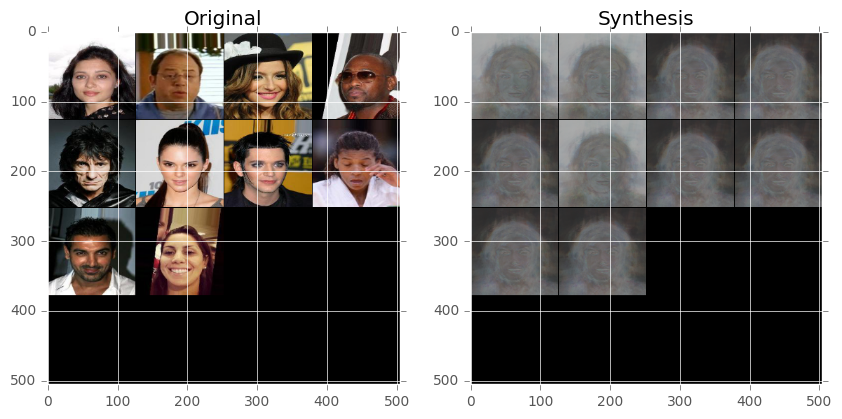

10 0.00612538284063


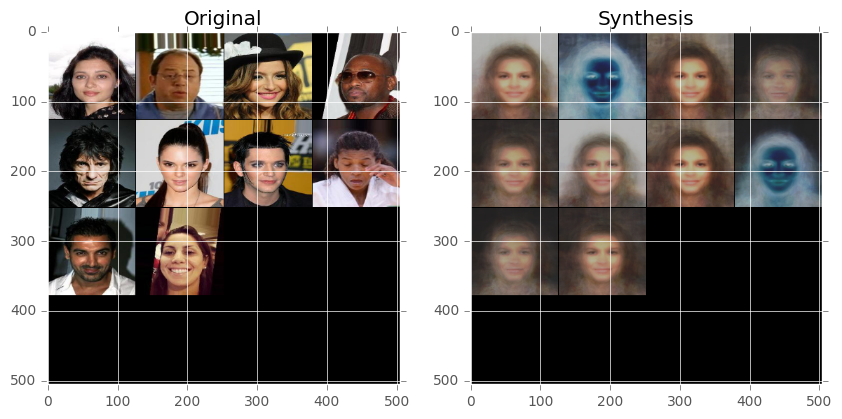

20 0.00596493291855


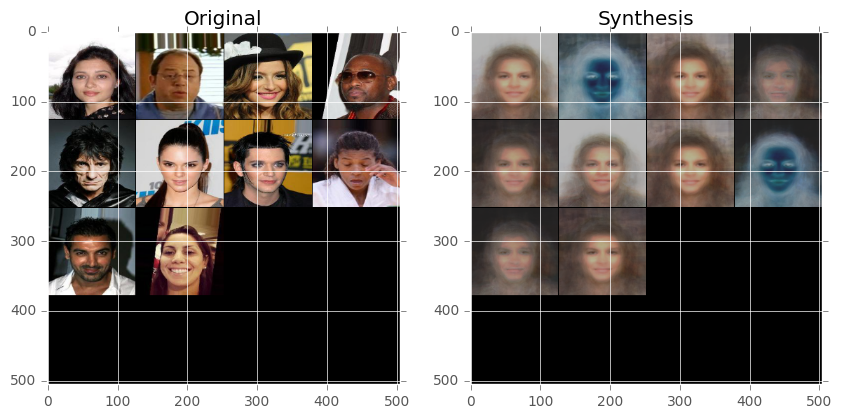

30 0.00598478370905


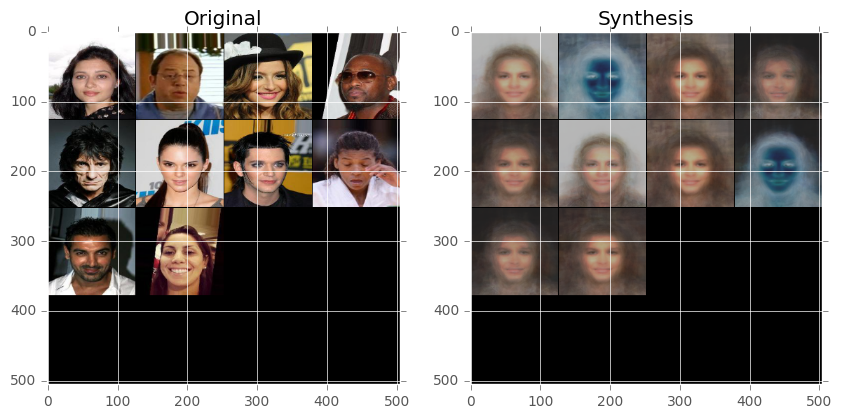

40 0.00592365753651


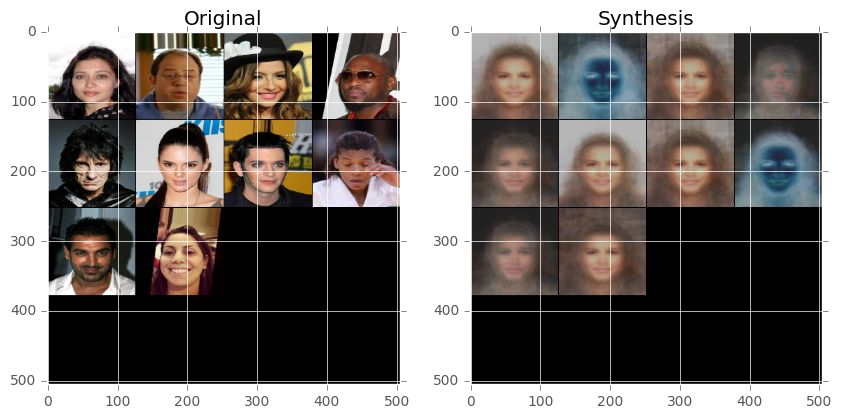

In [ ]:
# eğitim parametreleri 

batch_size = 10
n_epochs = 50
step = 10

# ilk yüz görüntü üzerinde işlem yapiyorduk.
examples = ds.X[:10]



#her adımda tekrar tekrar yapmak yerine burada bir kez bütün resimler process ediliyor. 
test_examples = preprocess(examples, ds.X).reshape(-1, n_features)


#montaj fonksiyonu yardımı ile görüntüler gösterilebilir. 
test_images = utils.montage(examples).astype(np.uint8)

# Görüntülerdeki değişimi göstermek için görüntülerin ilerlemeleri bir gif içinde tutulmaktadır. 
gifs = []

# eğitim başlıyor. epoch sayısınca tekrar edilecektir. 
for epoch_i in range(n_epochs):
    
    # cost değerinin izlenebilir olması için kullanılacak değer. 
    this_cost = 0
    
    # Bütün veri seti üzerinden iterasyon kullanılarak ilerlenir. 
    for batch_X, _ in ds.train.next_batch(batch_size=batch_size):
        
        # işlenecek resimler preprocess işlemine tabi tutulurlar. 
        this_batch = preprocess(batch_X, ds.X).reshape(-1, n_features)
        
        # Networkü hesaplayıp optimizasyon işlemi gerçekleştirilir. 
        this_cost += sess.run([cost,optimizer], feed_dict={X: this_batch})[0]
    
    # Her bir adım için ortalama ağırlık hesaplaması yapılır. 
    avg_cost = this_cost / ds.X.shape[0] / batch_size
    
    
    # Görselleştirme ve ağın öğrendiklerini göstermek için öğrenilen ağırlıklara göre arada sonuç resimler reconstruct edilir. 
    
    if epoch_i % step == 0:
        print(epoch_i, avg_cost)
        # örnek görüntüler için görüntülerin ağdan geçtikten sonra öğrendikleri gösterilir. 
        recon = sess.run(Y,feed_dict={X: test_examples})
                         
        # Görselleştirme için 2d olan sonuç vektörü 4d ye dönüştürülür. 
        rsz = recon.reshape(examples.shape)

        # ve deprocess işlemi gerçekleştirilir. 
        unnorm_img = deprocess(rsz, ds.X)
                         
        # o ila 255 arasona değerler çekilerek saturation'a engel olunur. 
        clipped = np.clip(unnorm_img, 0, 255)

        # Tekrar montaj fonksiyonu kullanılarak verilerin görüntülerin tek görüntüye dünüşümü sağlanır. 
        recon = utils.montage(clipped).astype(np.uint8)
        
        # Gir oluşturma için sonuç montajı gif olarak kaydedilir. 
        gifs.append(recon)

        fig, axs = plt.subplots(1, 2, figsize=(10, 10))
        axs[0].imshow(test_images)
        axs[0].set_title('Original')
        axs[1].imshow(recon)
        axs[1].set_title('Synthesis')
        fig.canvas.draw()
        plt.show()

Görüntüleri ağa vermeden önce ön işleme tabi tutuyoruz. Bir kez başta yaparak her yinelemeyi tekrar tekrar yapmak zorunda olmaktan kurtulmaktayız. Montaj fonksiyonu yardımı ile görüntüler gösterilebilir. Görüntülerdeki değişimi göstermek için görüntülerin ilerlemeleri bir gif içinde tutulmaktadır. Parametreler öğrenildikçe reconstruct işlemi daha doğru şekilde yapılmaya başladığı görülecektir. Görselleştirme ve ağın öğrendiklerini göstermek için öğrenilen ağırlıklara göre arada sonuç resimler reconstruct edilir. <br/>
**Parametrelerin sayısını artırarak aynı işlem tekrar edilip 116412 boyutlu boyutlu  (her bir piksek bir boyuta denk gelmekte) vektör görüntü 64 boyuta indirgenerek tekrardan geri dönüş sağlandığında elde edilen görüntüler için sonuçlar ve yorumlar aşağıda belirtilmiştir. **


In [ ]:
#aynı isimli graph elementleri oluşacağı için öncelikle aktif graph reset edilir. veya 
tf.reset_default_graph()


In [ ]:
#daha fazla boyutla eğitim tekrar edildiğinde 

encoder_dimensions = [4096,2048, 512, 128, 32]
X = tf.placeholder(dtype = tf.float32, shape=(None,n_features) )

Ws, z = encode(X, encoder_dimensions)
decoder_Ws = Ws[::-1]



In [ ]:
# Sonra encoderdaki katmanlar ters çevrilerek son layerının görüntü ile aynı katman sayısına sahip olamsı sağlarnır. 
decoder_dimensions = encoder_dimensions[::-1][1:] + [n_features]
print(decoder_dimensions)

assert(decoder_dimensions[-1] == n_features)

#girdi ile çıktı aynı olması beklenmektedir. Bunun üzerinden hata hesaplama yapılacaktır 
Y = decode(z, decoder_dimensions, decoder_Ws)
cost = tf.reduce_mean(tf.squared_difference(X, Y), 1)
print(cost.get_shape())

cost = tf.reduce_mean(cost)
learning_rate = 0.001
optimizer = tf.train.AdamOptimizer(learning_rate).minimize(cost)

#Session oluşturarak işlemin ilk adımlarına başlanılır. 

sess = tf.Session()
sess.run(tf.initialize_all_variables())

[128, 512, 2048, 4096, 46875]
(?,)


0 0.0081313470006


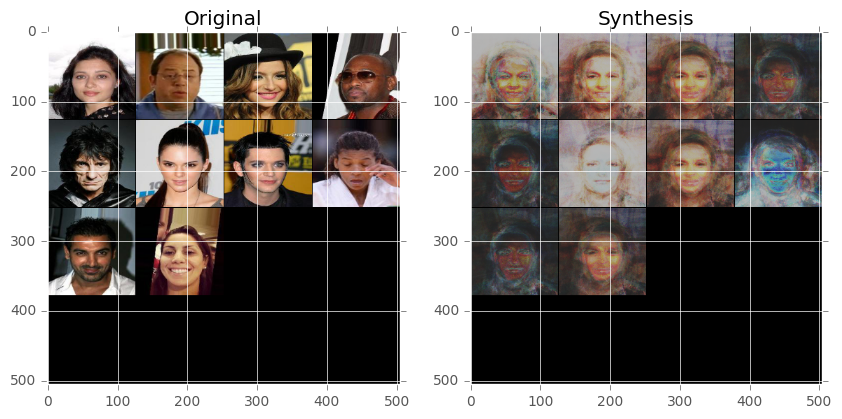

1 0.006399317801
2 0.0059610016346
3 0.00547495061159
4 0.00559704592824
5 0.00526002493501
6 0.00528831651807
7 0.00562146931887
8 0.00623197543621
9 0.00626968550682
10 0.00601096004248


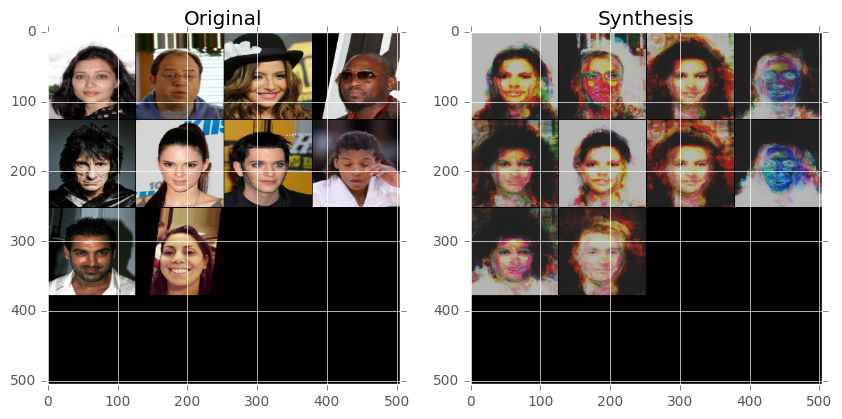

11 0.00601966828108
12 0.00579675075412
13 0.0058608443141
14 0.00643095195293
15 0.00613089048862
16 0.005917224437
17 0.00610352414846
18 0.0061338313818
19 0.00592334324121
20 0.00603330641985


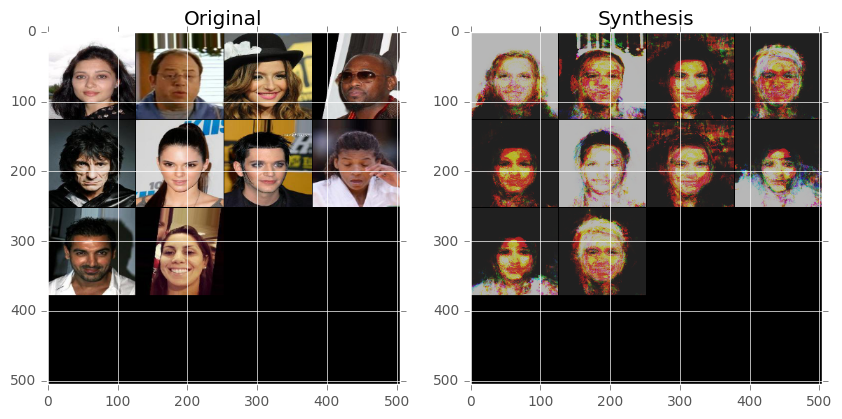

21 0.00591446024179
22 0.00607741773129
23 0.00613317766786
24 0.00587012535334
25 0.00561934265494
26 0.00566989713907
27 0.00628002583981
28 0.0058304516077
29 0.00601011103392
30 0.00659649151564


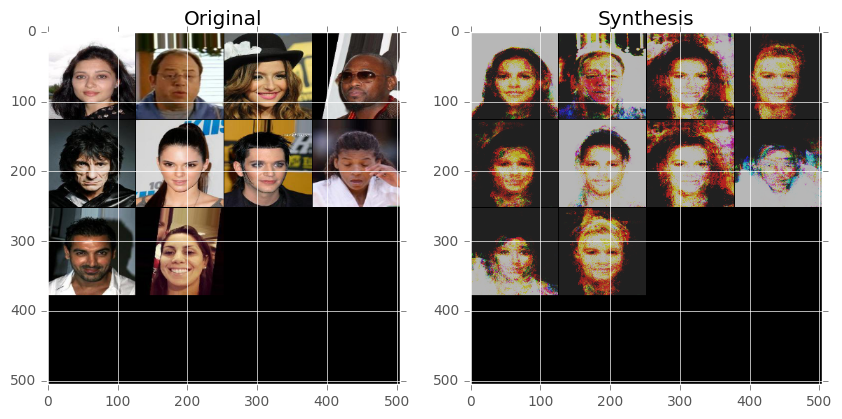

31 0.00604546663165
32 0.00630485141277
33 0.00630022889376
34 0.00583622956276
35 0.00614071708918
36 0.00574078243971
37 0.00579850658774
38 0.00563814544678
39 0.0056529955864
40 0.00575379738212


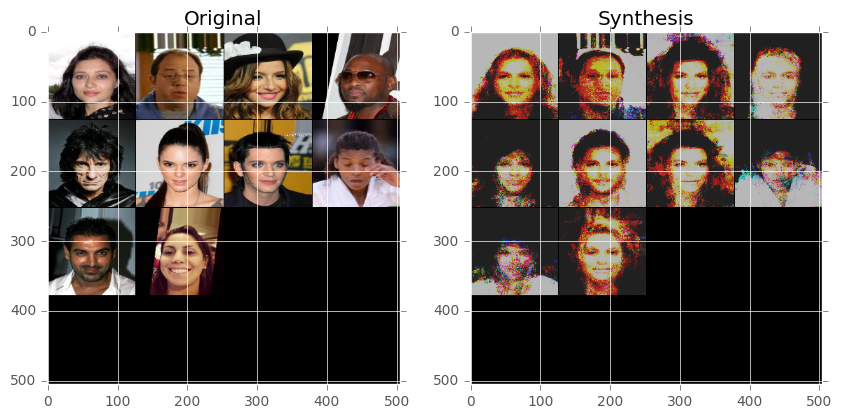

41 0.00560549646616
42 0.00534015220404
43 0.00532884427905
44 0.00522875362635
45 0.00512486878037
46 0.0053668115437
47 0.00524799096584
48 0.00532328528166
49 0.00543008890748
50 0.00567528918386


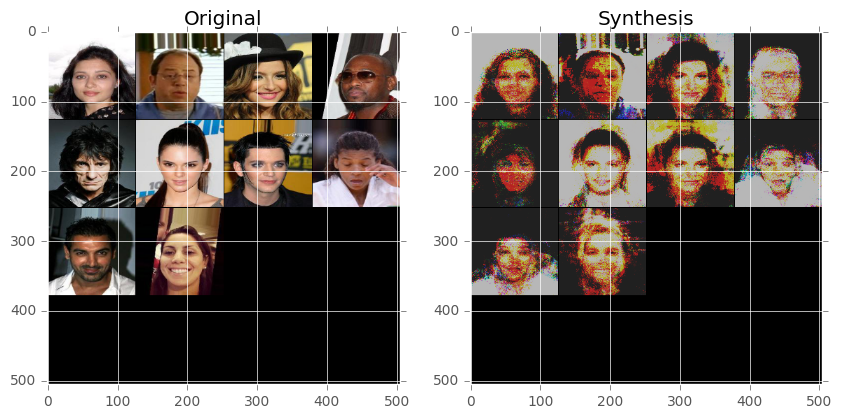

In [ ]:
# eğitim parametreleri 

batch_size = 10
n_epochs = 51
step = 10

# ilk yüz görüntü üzerinde işlem yapiyorduk.
examples = ds.X[:10]



#her adımda tekrar tekrar yapmak yerine burada bir kez bütün resimler process ediliyor. 
test_examples = preprocess(examples, ds.X).reshape(-1, n_features)


#montaj fonksiyonu yardımı ile görüntüler gösterilebilir. 
test_images = utils.montage(examples).astype(np.uint8)

# Görüntülerdeki değişimi göstermek için görüntülerin ilerlemeleri bir gif içinde tutulmaktadır. 
gifs = []

# eğitim başlıyor. epoch sayısınca tekrar edilecektir. 
for epoch_i in range(n_epochs):
    
    # cost değerinin izlenebilir olması için kullanılacak değer. 
    this_cost = 0
    
    # Bütün veri seti üzerinden iterasyon kullanılarak ilerlenir. 
    for batch_X, _ in ds.train.next_batch(batch_size=batch_size):
        
        # işlenecek resimler preprocess işlemine tabi tutulurlar. 
        this_batch = preprocess(batch_X, ds.X).reshape(-1, n_features)
        
        # Networkü hesaplayıp optimizasyon işlemi gerçekleştirilir. 
        this_cost += sess.run([cost, optimizer], feed_dict={X: this_batch})[0]
    
    # Her bir adım için ortalama ağırlık hesaplaması yapılır. 
    avg_cost = this_cost / ds.X.shape[0] / batch_size
    print(epoch_i, avg_cost)
    
    # Görselleştirme ve ağın öğrendiklerini göstermek için öğrenilen ağırlıklara göre arada sonuç resimler reconstruct edilir. 
    
    if epoch_i % step == 0:
        
        # örnek görüntüler için görüntülerin ağdan geçtikten sonra öğrendikleri gösterilir. 
        recon = sess.run(Y,feed_dict={X: test_examples})
                         
        # Görselleştirme için 2d olan sonuç vektörü 4d ye dönüştürülür. 
        rsz = recon.reshape(examples.shape)

        # ve deprocess işlemi gerçekleştirilir. 
        unnorm_img = deprocess(rsz, ds.X)
                         
        # o ila 255 arasona değerler çekilerek saturation'a engel olunur. 
        clipped = np.clip(unnorm_img, 0, 255)

        # Tekrar montaj fonksiyonu kullanılarak verilerin görüntülerin tek görüntüye dünüşümü sağlanır. 
        recon = utils.montage(clipped).astype(np.uint8)
        
        # Girdi oluşturma için sonuç montajı gif olarak kaydedilir. 
        gifs.append(recon)

        fig, axs = plt.subplots(1, 2, figsize=(10, 10))
        axs[0].imshow(test_images)
        axs[0].set_title('Original')
        axs[1].imshow(recon)
        axs[1].set_title('Synthesis')
        fig.canvas.draw()
        plt.show()

***Adım adım 1X32 boyutlu bir vektöre kadar düşen görüntüden elde edilen sonuçtaki iki boyutlu görüntü tekrar decode networküne verildiğinde katman sayısı arttığında daha net sonuçlar ve daha iyi detaylar veriği görülmüştür. Yani elde edilen görüntü orjinal resime daha fazla yaklaştığı görülmüştür. ***

<a name="part-two---my-data-set"></a>
## Kendi Veri Setim Üzerinden İşlmler 

Bundan sonraki aşamada kendi veri setim üzerinde işlem yapmayı ve sonuçları paylaşmayı düşünüyorum. 
görüntülerde kullanılan katman sayısını ve her katmanda bulunan neuron sayısı arttırarak daha iyi sonuçlar elde etmeye çalışılacaktır. 
Ve katman sayısı değişiminin toplam sonuç üzerindeki etkisi paylaşıalcaktır. 




In [ ]:
import os
files = [os.path.join('facesmydataset', file_i)
             for file_i in os.listdir('facesmydataset')
             if '.jpg' in file_i]


Bir önceki kısımda görüntüler ile eğitilen ağın eğitim sonucunda öğrenmiş olduğu yüz eğitimin sonucunda kullanılan ağdan elde edilebilir bir yüz öğrenmiş ve bunu da herhangi bir etiketleme yapmadan yapmayı başarmıştır. Ağda bulunan katman sayısı ve her katmandaki düğüm sayısı arttıkça daha genel şeylerin öğrenilmeye başllandığı açıkca görülmektedir. Bunun dışında görüleceği üzere görüntülerdeki varyansın fazlalığı bu parametreler ile yüzün öğrenilmesi ile sonuçlanmıştır. Buradan yola çıkarak daha az varyans içeren kendi resimlerim ile oluşturmuş olduğum ağ üzerinden yapılan işlemler tekrar edilecek sonuçlar daha fazla katman kullanılarak artırılıp sonuç analiz edilecektir. 
**Görüntü boyutu olarak 125*125 şeçilmiş büyük yada küçük görüntüler scale edilerek gerekli boyura getirilmiştir** 


In [ ]:
dsize=(125, 125)

from skimage.transform import resize as imresize
imgs=[imresize(plt.imread(f_i), dsize, preserve_range=True)  for f_i in files]
Xs = np.array(imgs).copy()

Görüntülerin hepsi okunduktan sonra scale edilerek bir matrise doldurulmaktadir. 


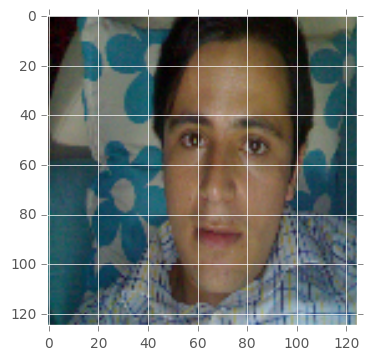

In [ ]:
plt.imshow(Xs[2].astype(np.uint8))

In [ ]:
#matrisin boyutu yazdırıp sonucu görelim. 
print(Xs.shape)

(28, 125, 125, 3)


In [ ]:
#tekrar dataset methodu ile görüntüler okunur. ve istenilen şekilde getirilir. 
ds = datasets.Dataset(Xs) 

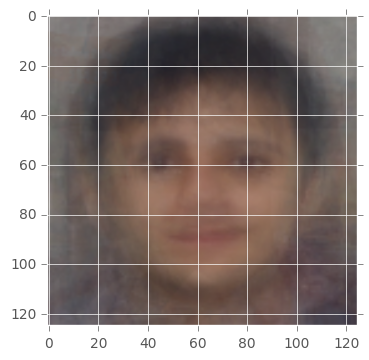

In [ ]:
#ortalama görüntü gösterelim. 

mean_img = ds.X.mean(axis=0).astype(np.uint8)
plt.imshow(mean_img)

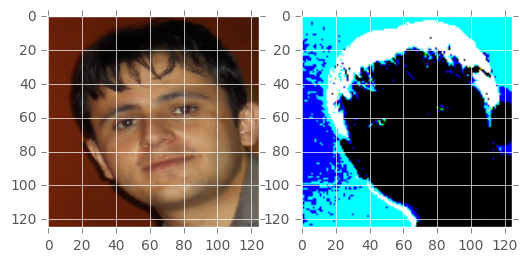

In [90]:
normiliezed = preprocess(ds.X[1], ds.X)
fig, axs=plt.subplots(1,2)

axs[0].imshow(deprocess(normiliezed, ds.X).astype(np.uint8))
axs[1].imshow(normiliezed.astype(np.uint8))

In [ ]:
#boyut hesaplaması tekrar yapılır. 
n_features = ds.X[0].shape[0]*ds.X[0].shape[1]*ds.X[0].shape[2]

In [ ]:
from tensorflow.python.framework.ops import reset_default_graph
reset_default_graph()

***Adım adım iki boyuta kadar düşen görüntüden elde edilen sonuçtaki iki boyutlu görüntü tekrar görüntüye verildiğinde elde edilen görüntü orjinal resime yaklaştığı görülecektir. ***

In [ ]:
encoder_dimensions = [2048,1024,512,256,128,64,32,16,8,4,2]
X = tf.placeholder(tf.float32,name='X',shape=[None, n_features])

assert(X.get_shape().as_list() == [None, n_features])

In [ ]:
# oluşturlan Fonsiyon çağrılarak ilk etapta networkün encode kısmı tamalanır.  
Ws, z = encode(X, encoder_dimensions)

# işlemin sonuçlarının doğru olduğu test edilir. 
assert(z.get_shape().as_list() == [None, 2])
assert(len(Ws) == len(encoder_dimensions))

In [ ]:
print([W_i.get_shape().as_list() for W_i in Ws]);
z.get_shape().as_list()

[[46875, 2048], [2048, 1024], [1024, 512], [512, 256], [256, 128], [128, 64], [64, 32], [32, 16], [16, 8], [8, 4], [4, 2]]


[None, 2]

tekrar iki boyuta kadar düşürüyoruz. 

In [ ]:
# ilk etapta decode için ağırlık listesi ters çevrilir. 
decoder_Ws = Ws[::-1]

# Sonra encoderdaki katmanlar ters çevrilerek son layerının görüntü ile aynı katman sayısına sahip olamsı sağlanır. 
decoder_dimensions = encoder_dimensions[::-1][1:] + [n_features]
print(decoder_dimensions)

assert(decoder_dimensions[-1] == n_features)

[4, 8, 16, 32, 64, 128, 256, 512, 1024, 2048, 46875]


In [ ]:
#girdi ile çıktı aynı olması beklenmektedir. Bunun üzerinden hata hesaplama yapılacaktır 

Y = decode(z, decoder_dimensions, decoder_Ws)

In [ ]:
#ağdaki toplam 'decoder' layerlar listelenir. 
[op.name for op in tf.get_default_graph().get_operations()
 if op.name.startswith('decoder')]

['decoder/layer/0/transpose/Rank',
 'decoder/layer/0/transpose/sub/y',
 'decoder/layer/0/transpose/sub',
 'decoder/layer/0/transpose/Range/start',
 'decoder/layer/0/transpose/Range/delta',
 'decoder/layer/0/transpose/Range',
 'decoder/layer/0/transpose/sub_1',
 'decoder/layer/0/transpose',
 'decoder/layer/0/MatMul',
 'decoder/layer/0/Tanh',
 'decoder/layer/1/transpose/Rank',
 'decoder/layer/1/transpose/sub/y',
 'decoder/layer/1/transpose/sub',
 'decoder/layer/1/transpose/Range/start',
 'decoder/layer/1/transpose/Range/delta',
 'decoder/layer/1/transpose/Range',
 'decoder/layer/1/transpose/sub_1',
 'decoder/layer/1/transpose',
 'decoder/layer/1/MatMul',
 'decoder/layer/1/Tanh',
 'decoder/layer/2/transpose/Rank',
 'decoder/layer/2/transpose/sub/y',
 'decoder/layer/2/transpose/sub',
 'decoder/layer/2/transpose/Range/start',
 'decoder/layer/2/transpose/Range/delta',
 'decoder/layer/2/transpose/Range',
 'decoder/layer/2/transpose/sub_1',
 'decoder/layer/2/transpose',
 'decoder/layer/2/MatMu

In [ ]:
#Giriş ve çıkış değerleri görüntüleri arasındaki farkın karesinin hata 
#fonksiyonu olarak tanımlayıp aradaki farkı azaltma için "loss" fonksiyonu olarak kullanacaktır. 
cost = tf.reduce_mean(tf.squared_difference(X, Y), 1)
print(cost.get_shape())
cost = tf.reduce_mean(cost)

(?,)


In [ ]:
#optimizer olarak adam optimizer kullanıalcaktır. 
learning_rate = 0.01
optimizer = tf.train.AdamOptimizer(learning_rate).minimize(cost)

sess = tf.Session()
sess.run(tf.initialize_all_variables())

0 0.000357168700014


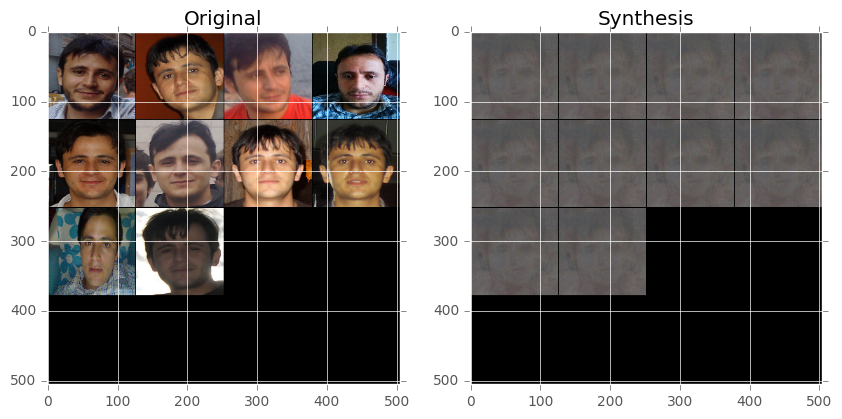

10 0.000548431830747


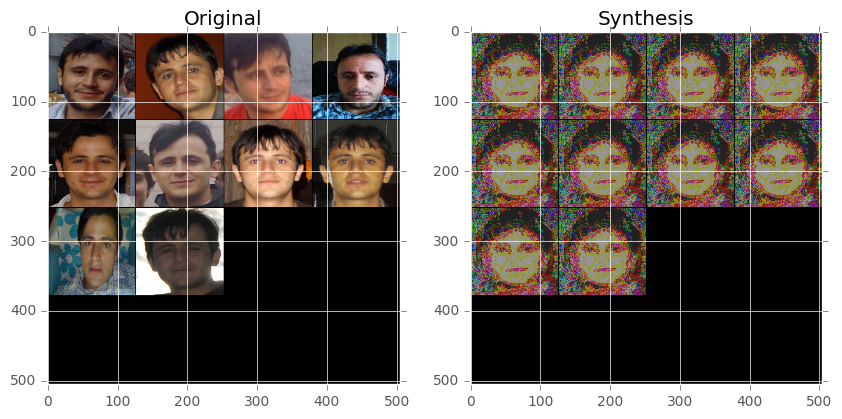

20 0.000551011179175


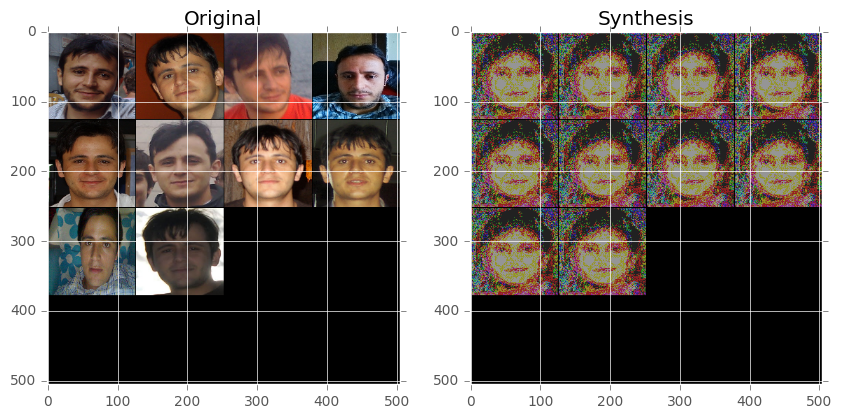

30 0.000551782250404


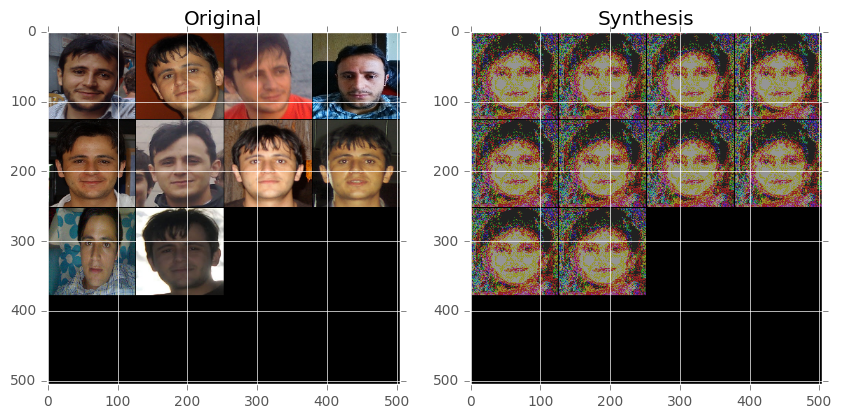

40 0.000552225581237


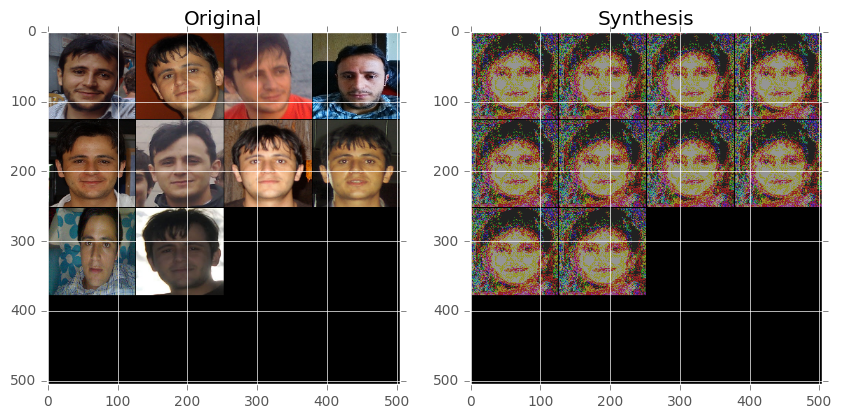

50 0.00055229225329


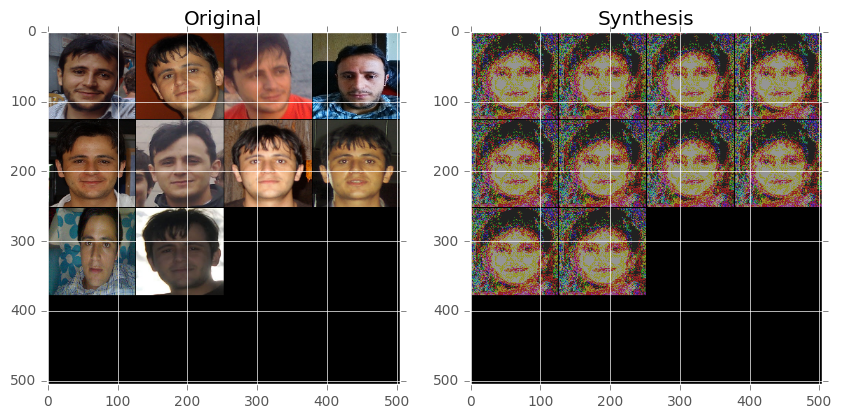

In [ ]:
# eğitim parametreleri 

batch_size = 100
n_epochs = 51
step = 10

# ilk yüz görüntü üzerinde işlem yapiyorduk.
examples = ds.X[:10]



#her adımda tekrar tekrar yapmak yerine burada bir kez bütün resimler process ediliyor. 
test_examples = preprocess(examples, ds.X).reshape(-1, n_features)


#montaj fonksiyonu yardımı ile görüntüler gösterilebilir. 
test_images = utils.montage(examples).astype(np.uint8)

# Görüntülerdeki değişimi göstermek için görüntülerin ilerlemeleri bir gif içinde tutulmaktadır. 
gifs = []

# eğitim başlıyor. epoch sayısınca tekrar edilecektir. 
for epoch_i in range(n_epochs):
    
    # cost değerinin izlenebilir olması için kullanılacak değer. 
    this_cost = 0
    
    # Bütün veri seti üzerinden iterasyon kullanılarak ilerlenir. 
    for batch_X, _ in ds.train.next_batch(batch_size=batch_size):
        
        # işlenecek resimler preprocess işlemine tabi tutulurlar. 
        this_batch = preprocess(batch_X, ds.X).reshape(-1, n_features)
        
        # Networkü hesaplayıp optimizasyon işlemi gerçekleştirilir. 
        this_cost += sess.run([cost, optimizer], feed_dict={X: this_batch})[0]
    
    # Her bir adım için ortalama ağırlık hesaplaması yapılır. 
    avg_cost = this_cost / ds.X.shape[0] / batch_size
    
    
    # Görselleştirme ve ağın öğrendiklerini göstermek için öğrenilen ağırlıklara göre arada sonuç resimler reconstruct edilir. 
    
    if epoch_i % step == 0:
        print(epoch_i, avg_cost)
        # örnek görüntüler için görüntülerin ağdan geçtikten sonra öğrendikleri gösterilir. 
        recon = sess.run(Y,feed_dict={X: test_examples})
                         
        # Görselleştirme için 2d olan sonuç vektörü 4d ye dönüştürülür. 
        rsz = recon.reshape(examples.shape)

        # ve deprocess işlemi gerçekleştirilir. 
        unnorm_img = deprocess(rsz, ds.X)
                         
        # 0 ila 255 arasona değerler çekilerek saturation'a engel olunur. 
        clipped = np.clip(unnorm_img, 0, 255)

        # Tekrar montaj fonksiyonu kullanılarak verilerin görüntülerin tek görüntüye dünüşümü sağlanır. 
        recon = utils.montage(clipped).astype(np.uint8)
        
        # Girdi oluşturma için sonuç montajı gif olarak kaydedilir. 
        gifs.append(recon)

        fig, axs = plt.subplots(1, 2, figsize=(10, 10))
        axs[0].imshow(test_images)
        axs[0].set_title('Original')
        axs[1].imshow(recon)
        axs[1].set_title('Synthesis')
        fig.canvas.draw()
        plt.show()

In [ ]:
print(this_batch.shape)

(28, 46875)


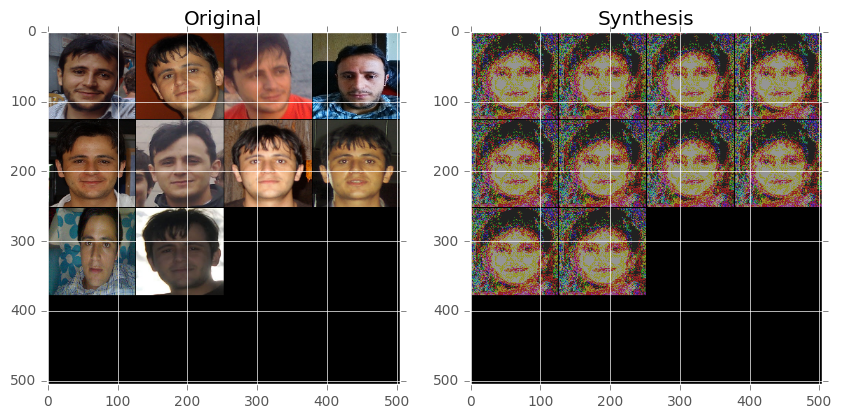

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(10, 10))
axs[0].imshow(test_images)
axs[0].set_title('Original')
axs[1].imshow(recon)
axs[1].set_title('Synthesis')
fig.canvas.draw()
plt.show()
plt.imsave(arr=test_images, fname='test125-51.png')
plt.imsave(arr=recon, fname='recon.png')

In [67]:
examples = ds.X[:]
print(examples.shape)

(28, 125, 125, 3)


(array([-0.08548259, -0.06818324, -0.07111654, -0.05972799, -0.0664167 ,
        -0.07973028, -0.06878889, -0.06508127, -0.06487353, -0.17297472,
        -0.06642841, -0.11361343, -0.11786187, -0.06884652,  0.49199948,
         0.48450035,  0.1906728 , -0.18648763, -0.07181832, -0.07025376,
        -0.11237171, -0.08813577, -0.07126167, -0.0737295 , -0.0620099 ,
        -0.07434185, -0.06924548, -0.12852837], dtype=float32),
 array([ 0.9417991 ,  0.94230753,  0.94221842,  0.94256461,  0.94236708,
         0.94189632,  0.9422856 ,  0.94240117,  0.94242632,  0.93869543,
         0.94237429,  0.94085634,  0.94074714,  0.94215304, -0.94970691,
        -0.95003086, -0.95599836,  0.93822455,  0.94217694,  0.94224828,
         0.94105613,  0.9417237 ,  0.94220752,  0.94214308,  0.94249821,
         0.94211799,  0.94228655,  0.94043452], dtype=float32))

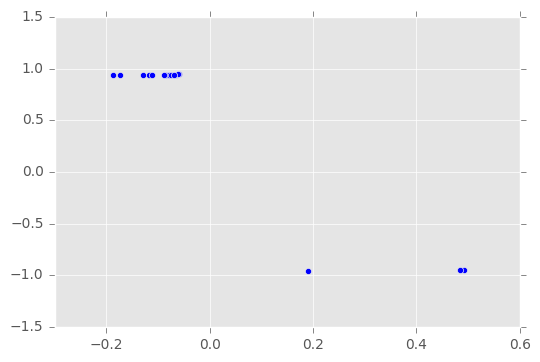

In [82]:
# görüntüler verilerek elde edilen vektörlerin bir birlerine göre uzayda yer  japlamaktadır. 
#Bu uzaydaki konumları aslında vektörlerin konumları üzerinden işlem yapılmak üzere değerleri Alınır. 
#Sonrasında yapılacak ise görüntülerin konumlandırılması ve bu konumlandırmadan sonra görüntülerden bir montaj oluşturma.

examples = ds.X

#her adımda tekrar tekrar yapmak yerine burada bir kez bütün resimler process ediliyor. 
test_examples = preprocess(examples, ds.X).reshape(-1, n_features)

zs = sess.run(z, feed_dict={X:test_examples})
plt.scatter(zs[:, 0], zs[:, 1])
zs[:, 0], zs[:, 1]

In [83]:
n_images = 28
idxs = np.linspace(np.min(zs) * 2.0, np.max(zs) * 2.0,
                   int(np.ceil(np.sqrt(n_images))))
xs, ys = np.meshgrid(idxs, idxs)
grid = np.dstack((ys, xs)).reshape(-1, 2)[:n_images,:]


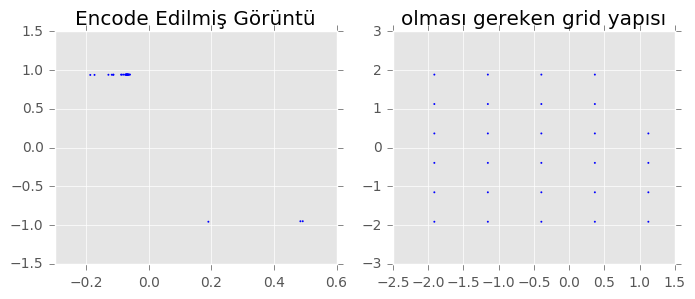

In [86]:
fig, axs = plt.subplots(1,2,figsize=(8,3))
axs[0].scatter(zs[:, 0], zs[:, 1],
               edgecolors='none', marker='o', s=2)
axs[0].set_title('Encode Edilmiş Görüntü')
axs[1].scatter(grid[:,0], grid[:,1],
               edgecolors='none', marker='o', s=2)
axs[1].set_title('olması gereken grid yapısı')

In [87]:
examples = ds.X

In [88]:
from scipy.spatial.distance import cdist
cost = cdist(grid[:, :], zs[:, :], 'sqeuclidean')
from scipy.optimize._hungarian import linear_sum_assignment
indexes = linear_sum_assignment(cost)

buna göre elde edilen görüntü üzerinde scpy kütüphanesinden linear uzaklık problemi ile indexlerin yakınlıkları sıralanarak bir düzlem üzerine yerleştirilerek görüntülerin birbirlerine göre uzaklıkları hesaplanarak indexler sıralanır ve görselleştirme ile bir birlerine daha fazla benzeyen görüntüler listelenir. 

TODO:TSN algoritması ile ayrımın yapılması ve gösterimin gerçekleştirilmesi.


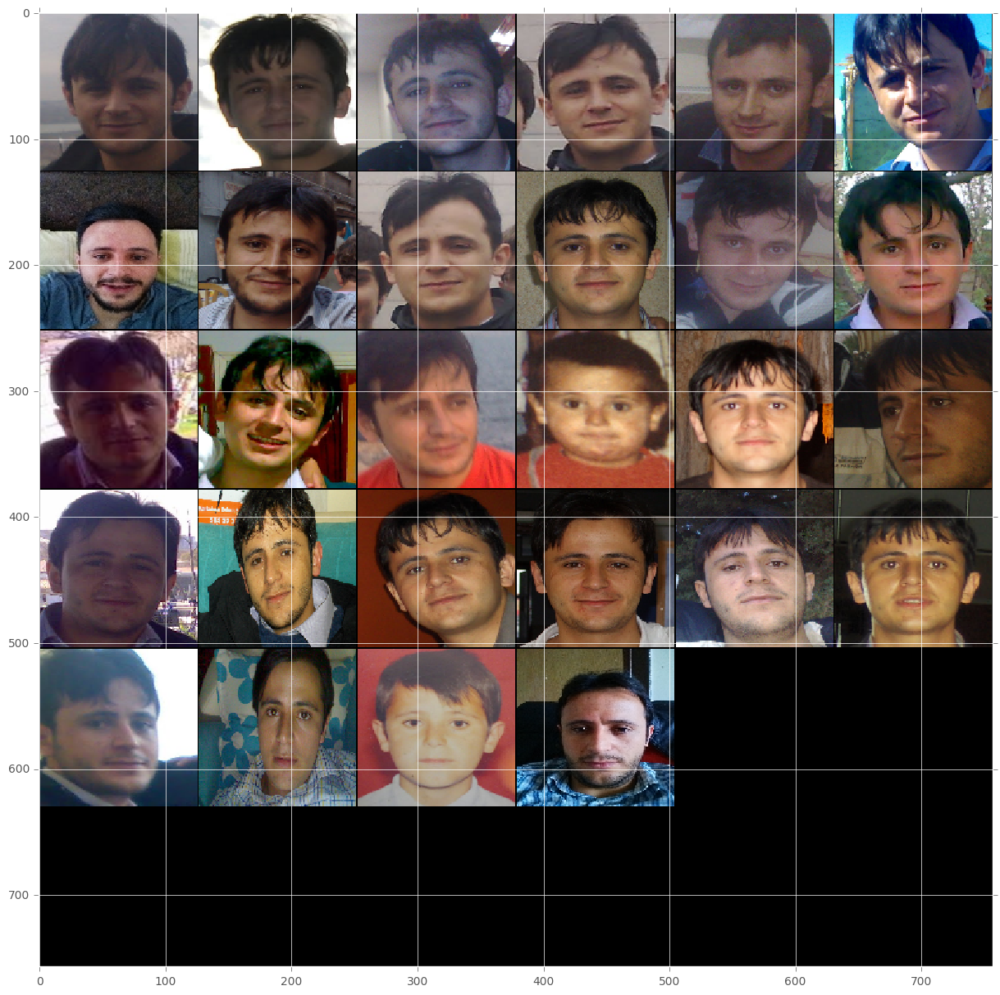

In [89]:
examples_sorted = []
for i in indexes[1]:
    examples_sorted.append(examples[i])
plt.figure(figsize=(15, 15))

img = utils.montage(np.array(examples_sorted)).astype(np.uint8)
plt.imshow(img,interpolation='nearest')

plt.imsave(arr=img, fname='sorted301-40p.png')